# Satellite Coastline Change Detection in the Three Bays Mangrove Forest, l'Estere, Haiti

In [53]:
import os
import copy
import itertools

import cv2 as cv
import numpy as np
import rioxarray as rxr
import earthpy.plot as ep
import geopandas as gpd
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans
from natsort import natsorted
from matplotlib import colors
import matplotlib.patches as mpatches
import matplotlib.cm as cm

## Data Acquisition

Load in chosen shapefile

In [54]:
bay_p = '../shapefiles/horn.shp'
bay_boundary = gpd.read_file(bay_p)
bay_boundary

,id,geometry
0,0,"POLYGON ((737987.692 2145265.248, 737987.692 2..."


Acquiring Planet Data GeoTIFFs

In [55]:
observations = []
names = []
directory = '../Planet/'
    # Looping over all GeoTIFF files
i = 0
for entry in os.scandir(directory):
    fp = entry.path
    names.append(fp)
    planet = rxr.open_rasterio(fp).rio.clip(bay_boundary.geometry, from_disk=True).squeeze()
    observations.append(planet)

### Visualization of Multispectral Cubes

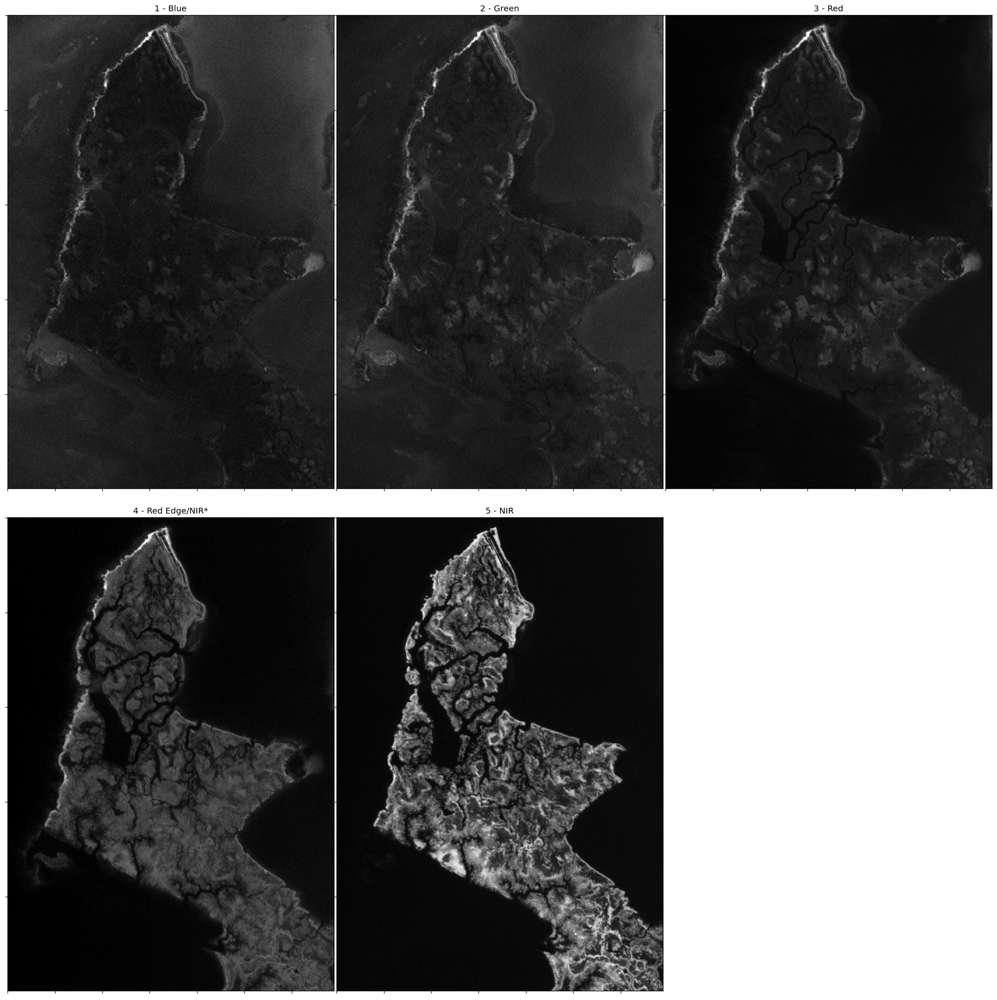

In [56]:
band_names = ['1 - Blue', '2 - Green', '3 - Red', '4 - Red Edge/NIR*', '5 - NIR']
fig, axs = plt.subplots(2,3, figsize=(20,20), dpi=120)
axs = list(itertools.chain.from_iterable(axs))

for i, band in enumerate(observations[0]):
    axs[i].imshow(observations[0][i], cmap='Greys_r')
    axs[i].set_title(band_names[i])
    axs[i].set_xticklabels([])
    axs[i].set_yticklabels([])
    
plt.axis('off')
plt.tight_layout(w_pad=0, h_pad=3)
plt.show()

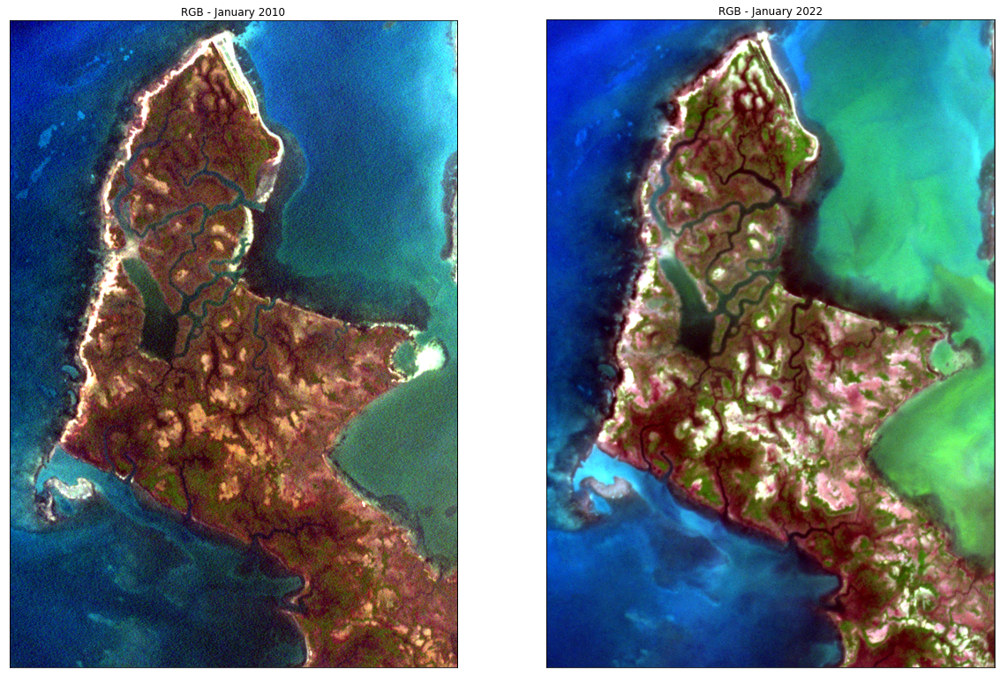

In [57]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(20,20))
ep.plot_rgb(observations[0], rgb=[2,1,0], title="RGB - January 2010", stretch=True,
            str_clip=1.3, ax=ax1)
ep.plot_rgb(observations[-1], rgb=[2,1,0], title="RGB - January 2022", stretch=True,
            str_clip=1.3, ax=ax2)
plt.show()

## NDWI Masking

<AxesSubplot:title={'center':'RGB - January 2022'}>

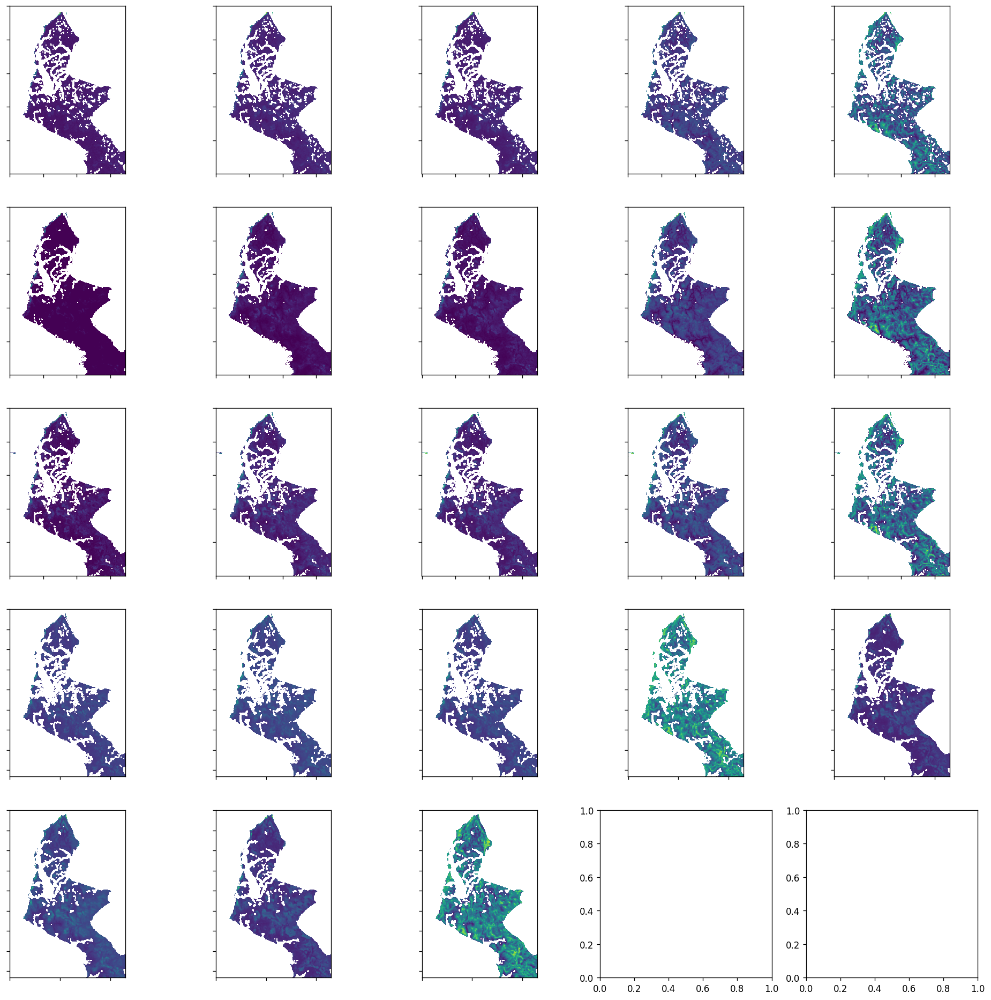

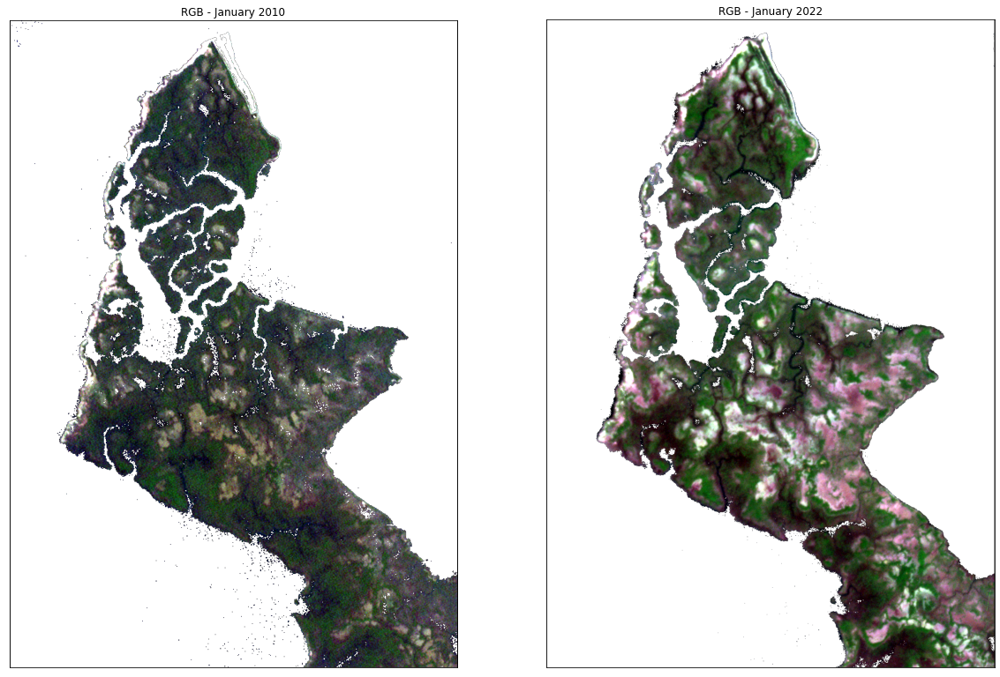

In [58]:
# NDWI = (green - nir)/(green + nir) McFeeters (1996)

fig, axs = plt.subplots(5,5, figsize=(20,20), dpi=120)
axs = list(itertools.chain.from_iterable(axs))
divnorm = colors.TwoSlopeNorm(vcenter=0)

# NDWI masks
ndwi_masks = []
for i,obs in enumerate(observations):
    try:
        ndwi = (obs[1]-obs[4])/(obs[1]+obs[4])
    except:
        ndwi = (obs[1]-obs[3])/(obs[1]+obs[3])
    ndwi_masks.append(ndwi)

# Masking Water out of observations
count=0
unmasked_ob = copy.copy(observations)
for i,obs in enumerate(observations):
    for j,band in enumerate(obs):
        band = np.ma.masked_where(ndwi_masks[i] > 0, band)
        axs[count].imshow(band)
        axs[count].set_xticklabels([])
        axs[count].set_yticklabels([])
        count+=1
        obs[j] = np.nan_to_num(band)

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(20,20))
ep.plot_rgb(observations[0], rgb=[2,1,0], title="RGB - January 2010", stretch=True,
            str_clip=1.3, ax=ax1)
ep.plot_rgb(observations[-1], rgb=[2,1,0], title="RGB - January 2022", stretch=True,
            str_clip=1.3, ax=ax2)
#plt.show()
    #nd = axs[i].imshow(ndwi, cmap='jet', norm=divnorm)
    #axs[i].imshow(ndwi, cmap='Greys_r')


## Automated Coastline Detection

### Segmentation

In [42]:
acqVecs = []
reshapedDatasets = []
shapes = []
for obs in observations:
    shapes.append(obs.shape)
    acq = [band.values.reshape(((band.shape)[0])*((band.shape)[1]), 1) for band in obs]
    acqVecs.append(acq)

for i,acq in enumerate(acqVecs):
    resh = np.array(acq).reshape(shapes[i][0], shapes[i][1]*shapes[i][2]).transpose()
    reshapedDatasets.append(resh)
    #reshapedDatasets = [np.array(acqVec).reshape(4, W*H).transpose() for acqVec in acqVecs]

In [43]:
# Segmenting through k-means
models = []

#acquisitions = [planet]
for resh in reshapedDatasets:
    print('Fitting model...')
    model = KMeans(2, max_iter=50, n_init=30, random_state=30)
    model.fit(resh)
    models.append(model)
    print('Done...')

Fitting model...
Done...
Fitting model...
Done...
Fitting model...
Done...
Fitting model...
Done...
Fitting model...
Done...


In [44]:
clusters = models[0].cluster_centers_
clusters

array([[ 168.96745835,  282.25427628,  287.26139416,  499.03452367,
        1002.24067707],
       [   9.88287668,   13.51962361,   13.79776531,   15.49049788,
          22.23673241]])

In [45]:
#cluster1 = models[0].predict(reshapedDatasets[0])
clusters = [models[i].predict(resh) for i,resh in enumerate(reshapedDatasets)]

### Canny Edge Implementation

[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]]


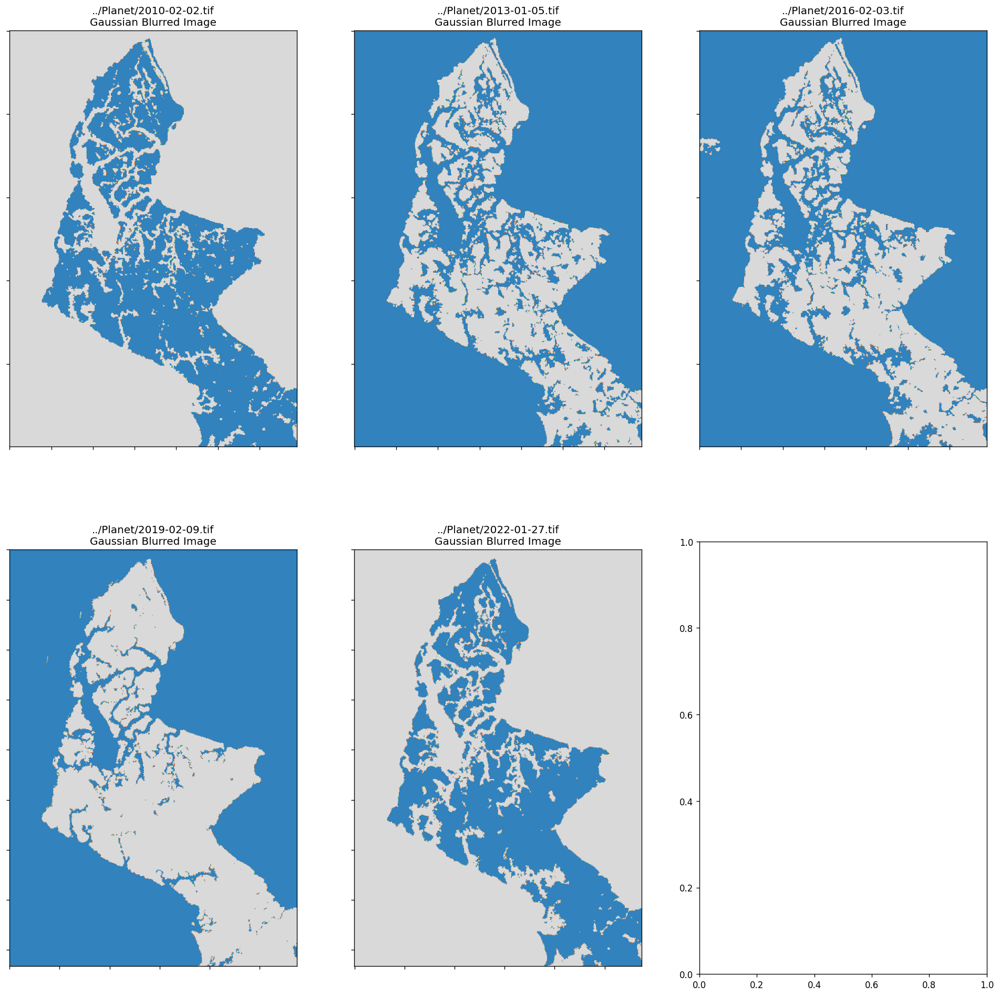

In [46]:
clusteredImages = [clusterLabels.reshape(observations[i][0].shape).astype("uint8") for i, clusterLabels in enumerate(clusters)]
blurredImages = [cv.GaussianBlur(clusteredImage, (5,5), 0) for clusteredImage in clusteredImages]

fig, axs = plt.subplots(2,3, figsize=(20,20), dpi=120)
axs = list(itertools.chain.from_iterable(axs))

labels = ['Feb2010', 'Jan2013', 'Feb2016', 'Feb2019', 'Jan2022']
for i, blur in enumerate(blurredImages):
    axs[i].imshow(blur, cmap='tab20c')
    axs[i].set_xticklabels([])
    axs[i].set_yticklabels([])
    axs[i].set_title(names[i]+'\nGaussian Blurred Image')

print(blurredImages[0])

In [47]:
v = np.median(blurredImages[0])

#---- Apply automatic Canny edge detection using the computed median----
lower = int(max(0, (1.0 - 0.33) * v))
upper = int(min(255, (1.0 + 0.33) * v))

rawEdges = [cv.Canny(blurredImage, lower,upper).astype('float').reshape(clusteredImages[i].shape) for i, blurredImage in enumerate(blurredImages)]
dim = (shapes[0][2], shapes[0][1])
# Resize the two last coastlines as they are bigger (3mx3m pixel res vs 5mx5m)
rawEdges[-1] = cv.resize(rawEdges[-1], dim, interpolation=cv.INTER_AREA)
rawEdges[-2] = cv.resize(rawEdges[-2], dim, interpolation=cv.INTER_AREA)

coastlines = [np.ma.masked_where(edge == 0, edge) for edge in rawEdges]

Blurred Image Masks (Better for visualizing cover than edge detection)

In [48]:
masks = [np.ma.masked_where(blur == 0, blur) for blur in blurredImages]
dim = (shapes[0][2], shapes[0][1])


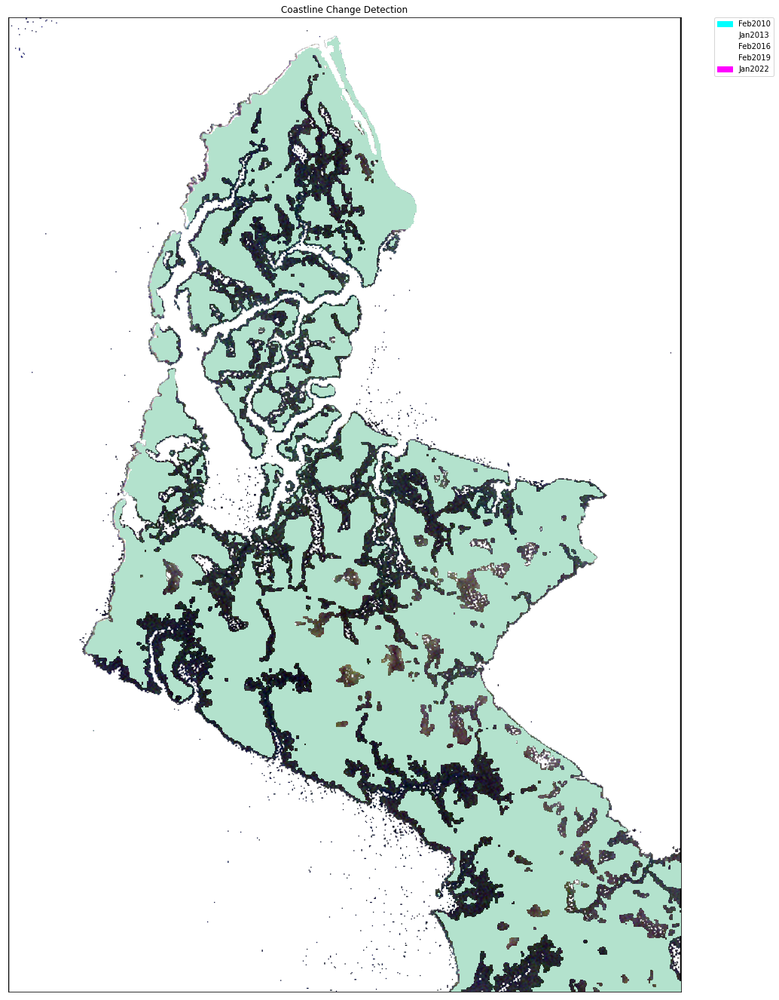

In [60]:
fig, ax = plt.subplots(figsize=(16,25))
ep.plot_rgb(unmasked_ob[0], rgb=[2,1,0], stretch=True,
            str_clip=.9, ax=ax)
cmaps = ['cool', 'Greys', 'Greys', 'Greys','spring']
labels = ['Feb2010', 'Jan2013', 'Feb2016', 'Feb2019', 'Jan2022']
colors = [cm.get_cmap(value) for value in cmaps]

a = blurredImages[0]
b = blurredImages[1]

c = np.ma.masked_where(a == 0, a)
d = np.ma.masked_where(b == 0, b)

#for i,coast in enumerate(coastlines):
    #ax.imshow(coast, cmap=cmaps[i], interpolation='none', label=cmaps[i])
# Apply the blurred Image mask to NDVI !!!!!
ax.imshow(c, cmap='Set1')
ax.imshow(d, cmap='Pastel2')
patches = [mpatches.Patch(color=colors[i](0), label=labels[i]) for i in range(len(cmaps)) ]
ax.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('Coastline Change Detection')
plt.show()